# We're going to compute a halo orbit

In [1]:
@time using ThreeBodyProblem
@time using OrdinaryDiffEq
@time using Plots
@time using LinearAlgebra
@time using PolynomialRoots

┌ Info: Precompiling ThreeBodyProblem [f5e9ba3c-56cf-4230-8a8f-3a70500a02a9]
└ @ Base loading.jl:1317
┌ Warning: Replacing docs for `SciMLOperators.AbstractSciMLOperator :: Union{}` in module `SciMLOperators`
└ @ Base.Docs docs/Docs.jl:240
┌ Warning: Replacing docs for `SciMLBase.sol :: Union{Tuple, Tuple{D}, Tuple{S}, Tuple{N}, Tuple{T}} where {T, N, S, D}` in module `SciMLBase`
└ @ Base.Docs docs/Docs.jl:240
  ** incremental compilation may be fatally broken for this module **

  ** incremental compilation may be fatally broken for this module **

  ** incremental compilation may be fatally broken for this module **

  ** incremental compilation may be fatally broken for this module **

┌ Warning: Replacing docs for `ThreeBodyProblem.azel2cart :: Union{Tuple{Any, Any}, Tuple{Any, Any, Any}}` in module `ThreeBodyProblem`
└ @ Base.Docs docs/Docs.jl:240
  ** incremental compilation may be fatally broken for this module **

  ** incremental compilation may be fatally broken for this modu

342.526818 seconds (26.17 M allocations: 1.859 GiB, 0.24% gc time)
  0.000119 seconds (116 allocations: 9.500 KiB)
  0.000113 seconds (116 allocations: 9.500 KiB)
  0.000071 seconds (116 allocations: 9.500 KiB)
  0.000048 seconds (116 allocations: 9.500 KiB)


In [4]:
sys = earth_moon()
sys.name

"Earth/Moon"

## Remember, we can create a custom system

In [5]:
## Use the following syntax
sys = System(ThreeBodyProblem.SUN, ThreeBodyProblem.EARTH)

System(Body(1.98847e30, 695700.0, 0.0, 0.0, "Sun", :yellow), Body(5.97237e24, 6371.0084, 1.495978976276167e8, 3.155814910224e7, "Earth", :blue), 1.495978976276167e8, 3.155814910224e7, 1.3271645321e11, 398613.89090999996, 3.0034911575429927e-6, 695700.0, 6371.0084, 1.3271645321e11, 398613.89090999996, 3.0034911575429927e-6, 695700.0, 6371.0084, 1.98847597237e30, 1.495978976276167e8, 5.022635424452555e6, 29.784741472435698, 5.930102218335328e-6, "Sun/Earth")

## Now, we are going to compute our first guess at a Halo Orbit using Richardson's expansion

### The details are complicated, but if you're curious check out this paper

#### D. L. Richardson, “Analytic Construction Of Periodic Orbits About The Collinear Points,” Celest. Mech., vol. 22, no. 3, pp. 241–253, 1980, doi: 10.1007/BF01229511.

In [6]:
"""
Calculate the ratio of Lagrange point distance from closest primary to distance between two primaries
"""
function gammaL(sys::System, Lpt::Int)
    μ = sys.μ

    # poly1 = [1, -1*(3-μ), (3-2*μ),     -μ,      2*μ,     -μ];
    # poly2 = [1,    (3-μ), (3-2*μ),     -μ,     -2*μ,     -μ];
    # poly3 = [1,    (2+μ), (1+2*μ), -(1-μ), -2*(1-μ), -(1-μ)];

    poly1 = [    -μ,      2*μ,     -μ, (3-2*μ), -1*(3-μ), 1];
    poly2 = [    -μ,     -2*μ,     -μ, (3-2*μ),    (3-μ), 1];
    poly3 = [-(1-μ), -2*(1-μ), -(1-μ), (1+2*μ),    (2+μ), 1];

    rt1 = roots(poly1)
    rt2 = roots(poly2)
    rt3 = roots(poly3)

    Γ = zeros(3)
    for i=1:5
        if isreal(rt1[i]) Γ[1]=rt1[i]; end
        if isreal(rt2[i]) Γ[2]=rt2[i]; end
        if isreal(rt3[i]) Γ[3]=rt3[i]; end
    end
    γ = Γ[Lpt];
end

"""
    rich3()
"""
function rich3(sys::System, Az, Lpt, NS, npts=10)
    μ = sys.μ
    γ = gammaL(sys, Lpt)

    if Lpt == 1;        won =  1;   primary = 1-μ;
    elseif Lpt == 2;    won = -1;   primary = 1-μ;
    elseif Lpt == 3;    won =  1;   primary = -μ;
    end

    c = zeros(4)

    if Lpt == 3
      for N = 2:4
        c[N]= (1/γ^3)*( 1-μ + (-primary*γ^(N+1))/((1+γ)^(N+1)) );
      end
    else
      for N = 2:4
        c[N]= (1/γ^3)*( (won^N)*μ + ((-1)^N)*((primary)*γ^(N+1))/((1+(-won)*γ)^(N+1)) );
      end
    end

    # polylambda = [1, 0, (c[2]-2), 0, -(c[2]-1)*(1+2*c[2])];
    polylambda = [-(c[2]-1)*(1+2*c[2]), 0, c[2]-2, 0, 1];
    lambdaroots = roots(polylambda); # lambda = frequency of orbit
    ## Stuck here 6/22/21 (need to select the right root)
    λ = real(sort(lambdaroots, by = x -> abs(imag(x))))[1]

    # if Lpt==3
    #    λ = lambdaroots[1];
    # else
    #    λ = lambdaroots[1];
    # end

    k   = 2*λ/(λ^2 + 1 - c[2]);


    del = λ^2 - c[2];

    d1  = ((3*λ^2)/k)*(k*( 6*λ^2 -1) - 2*λ);
    d2  = ((8*λ^2)/k)*(k*(11*λ^2 -1) - 2*λ);

    a21 = (3*c[3]*(k^2 - 2))/(4*(1 + 2*c[2]));
    a22 = 3*c[3]/(4*(1 + 2*c[2]));
    a23 = -(3*c[3]*λ/(4*k*d1))*( 3*(k^3)*λ - 6*k*(k-λ) + 4);
    a24 = -(3*c[3]*λ/(4*k*d1))*( 2 + 3*k*λ );

    b21 = -(3*c[3]*λ/(2*d1))*(3*k*λ - 4);
    b22 = 3*c[3]*λ/d1;
    d21 = -c[3]/(2*λ^2);

    a31 = -(9*λ/(4*d2))*(4*c[3]*(k*a23 - b21) + k*c[4]*(4 + k^2)) + ((9*λ^2 + 1 -c[2])/(2*d2))*(3*c[3]*(2*a23 - k*b21) + c[4]*(2 + 3*k^2));
    a32 = -(1/d2)*( (9*λ/4)*(4*c[3]*(k*a24 - b22) + k*c[4]) + 1.5*(9*λ^2 + 1 - c[2])*( c[3]*(k*b22 + d21 - 2*a24) - c[4]) );

    b31 = (.375/d2)*( 8*λ*(3*c[3]*(k*b21 - 2*a23) - c[4]*(2 + 3*k^2)) + (9*λ^2 + 1 + 2*c[2])*(4*c[3]*(k*a23 - b21) + k*c[4]*(4 + k^2)) );
    b32 = (1/d2)*( 9*λ*(c[3]*(k*b22 + d21 - 2*a24) - c[4]) + .375*(9*λ^2 + 1 + 2*c[2])*(4*c[3]*(k*a24 - b22) + k*c[4]) );

    d31 = (3/(64*λ^2))*(4*c[3]*a24 + c[4]);
    d32 = (3/(64*λ^2))*(4*c[3]*(a23- d21) + c[4]*(4 + k^2));

    s1  = (1/(2*λ*(λ*(1+k^2) - 2*k)))*( 1.5*c[3]*(2*a21*(k^2 - 2)-a23*(k^2 + 2) - 2*k*b21) - .375*c[4]*(3*k^4 - 8*k^2 + 8) );
    s2  = (1/(2*λ*(λ*(1+k^2) - 2*k)))*( 1.5*c[3]*(2*a22*(k^2 - 2)+a24*(k^2 + 2) + 2*k*b22 + 5*d21) + .375*c[4]*(12 - k^2) );

    a1  = -1.5*c[3]*(2*a21+ a23 + 5*d21) - .375*c[4]*(12-k^2);
    a2  =  1.5*c[3]*(a24-2*a22) + 1.125*c[4];

    l1 = a1 + 2*(λ^2)*s1;
    l2 = a2 + 2*(λ^2)*s2;

    # ADDITIONAL TERMS FROM GEOMETRY CENTER PAPER
    b33 = -k/(16*λ)*(12*c[3]*(b21-2*k*a21+k*a23)+3*c[4]*k*(3*k^2-4)+16*s1*λ*(λ*k-1));
    b34 = -k/(8*λ)*(-12*c[3]*k*a22+3*c[4]*k+8*s2*λ*(λ*k-1));
    b35 = -k/(16*λ)*(12*c[3]*(b22+k*a24)+3*c[4]*k);

    deltan = 2 - NS;

    Ax  = sqrt( (-del - l2*Az^2)/l1 );
    omg = 1+s1*Ax^2+s2*Az^2;
    freq=λ*omg;
    period=2*pi/freq;

    rvi  = zeros(npts,6);
    ss   = zeros(npts,1);
    if npts > 1
       dtau1= 2*pi/(npts-1);
    else
       dtau1= 2*pi;
    end
    tau1 = 0;
    for i=1:npts
       x = a21*Ax^2 + a22*Az^2 - Ax*cos(tau1) + (a23*Ax^2 - a24*Az^2)*cos(2*tau1) + (a31*Ax^3 - a32*Ax*Az^2)*cos(3*tau1);
       y = k*Ax*sin(tau1) + (b21*Ax^2 - b22*Az^2)*sin(2*tau1) + (b31*Ax^3 - b32*Ax*Az^2)*sin(3*tau1);
       z = deltan*Az*cos(tau1) + deltan*d21*Ax*Az*(cos(2*tau1) - 3) + deltan*(d32*Az*Ax^2 - d31*Az^3)*cos(3*tau1);
       y_plus = (b33*Ax^3 + b34*Ax*Az^2 - b35*Ax*Az^2)*sin(tau1);
       y = y + y_plus;     # ADD EXTRA TERMS FROM G.C. PAPER

       xdot = freq*Ax*sin(tau1) - 2*freq*(a23*Ax^2-a24*Az^2)*sin(2*tau1) - 3*freq*(a31*Ax^3 - a32*Ax*Az^2)*sin(3*tau1);
       ydot = freq*(k*Ax*cos(tau1) + 2*(b21*Ax^2 - b22*Az^2)*cos(2*tau1) + 3*(b31*Ax^3 - b32*Ax*Az^2)*cos(3*tau1));
       zdot = - freq*deltan*Az*sin(tau1) - 2*freq*deltan*d21*Ax*Az*sin(2*tau1) - 3*freq*deltan*(d32*Az*Ax^2 - d31*Az^3)*sin(3*tau1);
       ydot_plus = freq*(b33*Ax^3 + b34*Ax*Az^2 - b35*Ax*Az^2)*cos(tau1);
       ydot = ydot_plus + ydot; # ADD EXTRA TERMS FROM G.C. PAPER

       rvi[i,:]= γ*[ (primary+γ*(-won+x))/γ, y, z, xdot, ydot, zdot];
       ss[i]   = tau1/freq;
       tau1=tau1+dtau1;
    end

    return ss, rvi, period, Ax
end


rich3

In [7]:
Az = 0.001 # The amplitude of the orbit in the z direction
Lpt = 2 # Which libration point will I center about
NS = 1
npts = 100
t, rvs, T, Ax = rich3(sys, Az, Lpt, NS, npts)

([-0.0; -0.03130993066454046; … ; -3.068373205124964; -3.0996831357895043], [1.0084225350657474 0.0 … 0.00946368499438901 0.0; 1.0084235568453723 -0.0002960596904601177 … 0.009439965208142968 1.6336202861218245e-6; … ; 1.0084235568453723 0.000296059690460126 … 0.009439965208142966 -1.6336202861218705e-6; 1.0084225350657474 9.47868662660598e-18 … 0.00946368499438901 -5.293192235114822e-20], -3.099683135789505, 0.14002450533941277)

## Let's plot the orbit to see what it looks like

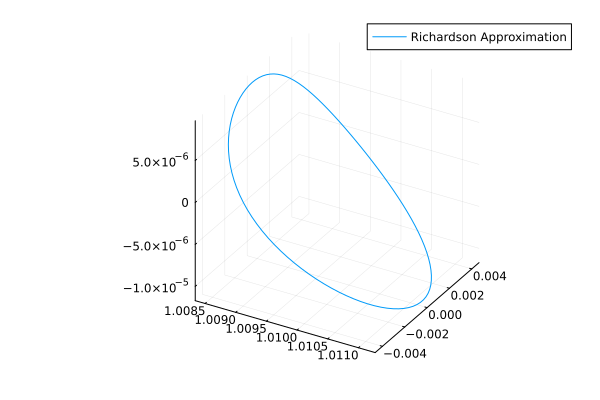

In [8]:
plot(rvs[:,1],rvs[:,2],rvs[:,3],label="Richardson Approximation")

## Remember, this is a third order approximation. What will happen if we actually integrate this trajectory?

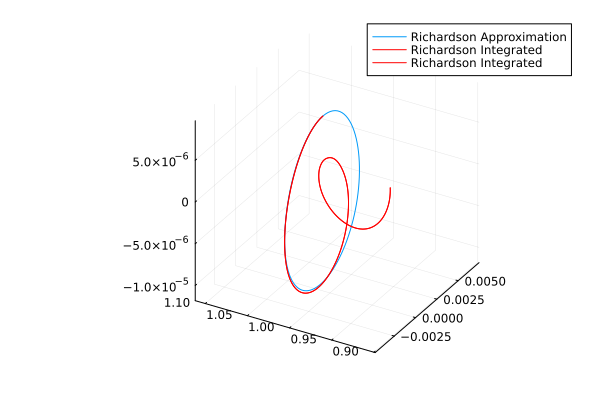

In [11]:
tspan = (0., T)
prob = ODEProblem(CR3BPdynamics!,rvs[1,:],tspan,sys)
sol = solve(prob, TsitPap8(), reltol=1e-12)
plot!(sol,idxs=(1,2,3),label="Richardson Integrated",linecolor=:red)

## We can see that this orbit diverges before completing a period. We need to use a differential corrector to hone in on the true periodic orbit.

In [16]:
"""
   differential_corrector(sys::System, rv₀; myconst=3, iter=100, plot=false, t0=0., tf=1., dir=1, tol=1e-12)

Given a sufficiently close guess at a periodic trajectory rv₀, returns the corrected initial condition and period
"""
function differential_corrector(sys::System, rv₀; myconst=3, iter=100, plot=false, t0=0., tf=1., dir=1, tol=1e-12)
   Φ₀ = I(6)

   tspan = (t0, tf)

   # event function
   condition(u, t, integrator) = u[2]
   affect!(integrator) = terminate!(integrator)
   cb = OrdinaryDiffEq.ContinuousCallback(condition, affect!)

   for k = 1:iter
      w₀ = vcat(rv₀, reshape(Φ₀,36,1))

      prob = ODEProblem(CR3BPstm!,w₀,tspan,sys)
      sol = solve(prob, TsitPap8(), reltol=tol, callback=cb)

      w = sol[end]
      rv = w[1:6]
      Φ = reshape(w[7:42],6,6)
      global T = 2*sol.t[end]

      ∂ẋ = 0 - rv[4]
      ∂ż = 0 - rv[6]

      if norm([∂ẋ, ∂ż]) < tol
         break
      end
      if k == iter
         @warn("Differential corrector did not converge")
      end

      ẋ,ẏ,ż,ẍ,ÿ,z̈ = CR3BPdynamics(rv, sys, 0)

      if myconst == 1
         ∂Φ = [Φ[4,3] Φ[4,5];
               Φ[6,3] Φ[6,5]]
         dyad = [ẍ;z̈]*[Φ[2,3] Φ[2,5]]

         ∂z, ∂ẏ = (∂Φ - dyad/ẏ)\[∂ẋ; ∂ż]
         rv₀[3] += ∂z
         rv₀[5] += ∂ẏ
      elseif myconst == 3
         ∂Φ = [Φ[4,1] Φ[4,5];
               Φ[6,1] Φ[6,5]]
         dyad = [ẍ;z̈]*[Φ[2,1] Φ[2,5]]

         ∂x, ∂ẏ = (∂Φ - dyad/ẏ)\[∂ẋ; ∂ż]
         rv₀[1] += ∂x
         rv₀[5] += ∂ẏ
      elseif myconst == 5
         ∂Φ = [Φ[4,1] Φ[4,3];
               Φ[6,1] Φ[6,3]]
         dyad = [ẍ;z̈]*[Φ[2,1] Φ[2,5]]

         ∂x, ∂z = (∂Φ - dyad/ẏ)\[∂ẋ; ∂ż]
         rv₀[1] += ∂x
         rv₀[3] += ∂ẏ
      else
         error("myconst should be 1, 3, or 5")
      end

   end

   return rv₀, T
end

rv₀, T = differential_corrector(sys, rvs[1,:], myconst=3, tf=T)

LoadError: error in method definition: function ThreeBodyProblem.differential_corrector must be explicitly imported to be extended

## Now we've corrected our initial condition, and when we integrate the orbit, it returns to its initial state

ThreeBodyProblem

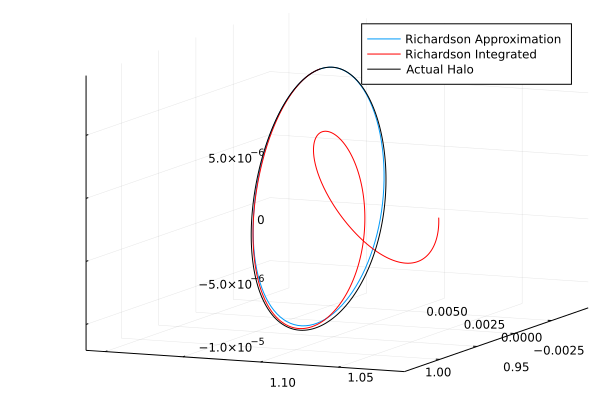

In [54]:
tspan = (0., T)
prob = ODEProblem(CR3BPdynamics!,rv₀,tspan,sys)
sol = solve(prob, reltol=1e-12)
plot!(sol,vars=(1,2,3),color=:black,label="Actual Halo")

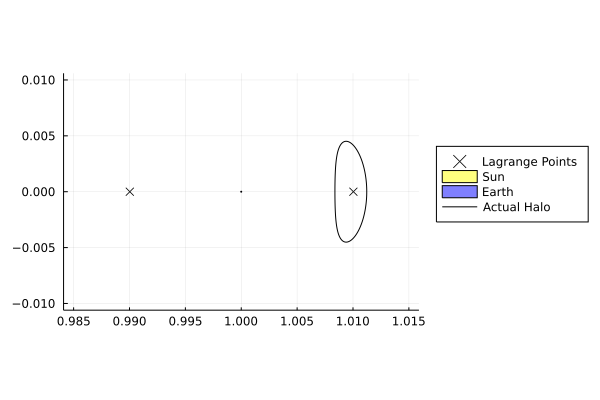

In [59]:
plot(sys)
plot!(sol,vars=(1,2),color=:black,label="Actual Halo")
plot!(aspect_ratio=:equal,ylims=[-0.01,0.01],xlims=[0.985,1.015],legend=:outerright,flip=false)

## Now we compute the stable and unstable manifolds of the halo orbit, similar to what we did for the Lagrange points

In [60]:
# This function requires the initial condition and period of a periodic orbit
Wsp, Wsn, Wup, Wun = invariant_manifolds(sys,rv₀,T,tf=10.,nPts=100)

(Any[t: [0.0, -0.17004359501337085, -0.39902581005405635, -0.6781576058193477, -1.0096452716218112, -1.429644559507396, -1.8722401154203674, -2.3805862279255567, -2.8667915290929895, -3.3341604400799016  …  -4.843110199816941, -5.412833654819027, -5.996503434628204, -6.515309203242055, -6.9819729865322735, -7.554624657132904, -8.193619048377302, -8.892278826332872, -9.609091442502622, -10.0]
u: [[1.0083820720762737, 2.321994347888324e-7, 9.124802969249415e-6, -8.018896199777311e-7, 0.00975208948085268, -9.78204006330154e-10], [1.0084102450274277, -0.001615580361218826, 8.342917577522907e-6, -0.0003637126789332941, 0.009012986611686568, 8.984410842928585e-6], [1.0085920864324507, -0.0033852977761605983, 5.21521526086213e-6, -0.0013161461231180217, 0.006176229137965918, 1.744168587882466e-5], [1.0091632533273673, -0.004457993704402063, -2.6214118517786146e-7, -0.002723028621055439, 0.0013944327358336064, 2.0594057244867957e-5], [1.010196601522974, -0.003955139918150369, -6.61183238806072

In [62]:
for i = 1:length(Wsp)
    plot!(Wsp[i],vars=(1,2),label="",linecolor=:blue)
    plot!(Wsn[i],vars=(1,2),label="",linecolor=:cyan)
    plot!(Wup[i],vars=(1,2),label="",linecolor=:red)
    plot!(Wun[i],vars=(1,2),label="",linecolor=:magenta)
end
plot!(flip=false,aspect_ratio=:equal,legend=:outerright,xlim=[0.995,1.03],ylim=[-0.02,0.02])
